In [2]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
from glob import glob 

# https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.map_coordinates.html

import scipy 
from scipy import ndimage

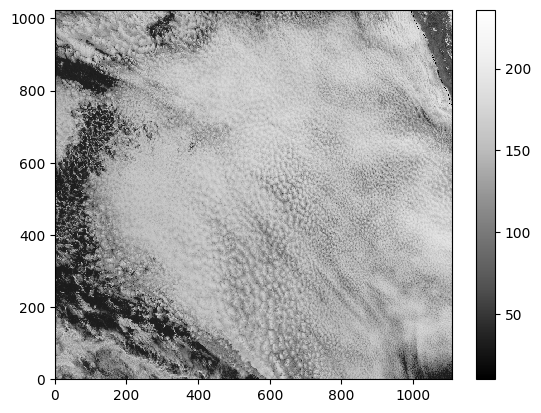

In [3]:
# Define the path to the directory containing the images
path = 'C:\\Users\\ratynski\\Documents\\Python_Projects\\stratocu_waves-main\\DATA\\2022_09_06\\'
# Use glob to find the images in the specified path
fnames = np.sort(glob(path + '*9_06*png'))
images = []

# Read the images and process them
for i, fname in enumerate(fnames):
    img = imageio.v2.imread(fname)
    red = np.flipud(img[:, 400:, 0])
    images.append(red)  # Just red channel, just 400:end in the x dir, flip y

# Plot the first processed image
plt.pcolormesh(images[0], cmap='Greys_r')
plt.colorbar()
plt.show()


In [4]:
# Get the dimensions of the image
height, width = red.shape[:2]

# Create 2D arrays of x and y
x = np.arange(width)
y = np.arange(height)

# Create a meshgrid of x and y
X, Y = np.meshgrid(x, y)


# Pixel size: nominal for MKS units to pixel units 
DX = 2000             # m, pixel size (nominal)

# Xm and Ym are Coordinates in meters, distances measured from central point of image
Xm = (X-X.mean())*DX
Ym = (Y-Y.mean())*DX 

-------------------

# Wave parameters for warping and modulating an image

"In one period, 7–9 October 2008, the waves modulated cloud-top-height by up to 400 m peak-to-trough, propagating perpendicular to the synoptic boundary layer flow with phase speed 15.3 m s−1, period ∼1 h and horizontal wavelength 55 km. The gravity waves were observed to be non-dispersive. “ from https://doi.org/10.1002/qj.1952

For a wave moving toward 45 degrees (northeast), define k and l as positive (sin and cos of nav angle). Let's take z = sin( k(x-ct) + l(y-ct) ) which is indeed moving NEward with time. Then u and v are both positive at z crests (sketch it). That means dx and dy are positve when time is 1/4 period later, or when 90deg of phase have been subtracted since t appears with a negative sign in the formula for phase (x-ct). 

In [5]:
# One wave packet 
cphase = 14            # m/s
wavelength = 150*1000. # meters
period = wavelength/cphase 
direction = 225       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude = 100      # meters, vertical displacement
PBLdepth = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k = 2*np.pi/wavelength * np.sin( (direction) *np.pi/180 )   
l = 2*np.pi/wavelength * np.cos( (direction) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x = -400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y = 400*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x  = 400*1000.  # meters
packet_width_y  = 300*1000.  # meters
Ampwindow = np.exp(-( ((Xm-packet_center_x)/packet_width_x)**2 + \
                      ((Ym-packet_center_y)/packet_width_y)**2 )) 
     
#plt.pcolormesh(Ampwindow); plt.colorbar()

In [6]:
# A second wave packet 
cphase2 = 20            # m/s
wavelength2 = 100*1000. # meters
period2 = wavelength2/cphase2 
direction2 = 140       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude2 = 50      # meters, vertical displacement
PBLdepth2 = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k2 = 2*np.pi/wavelength2 * np.sin( (direction2) *np.pi/180 )   
l2 = 2*np.pi/wavelength2 * np.cos( (direction2) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x2 = 400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y2 = 100*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x2  = 200*1000.  # meters
packet_width_y2  = 600*1000.  # meters
Ampwindow2 = np.exp(-( ((Xm-packet_center_x2)/packet_width_x2)**2 + \
                      ( (Ym-packet_center_y2)/packet_width_y2)**2 )) 
     

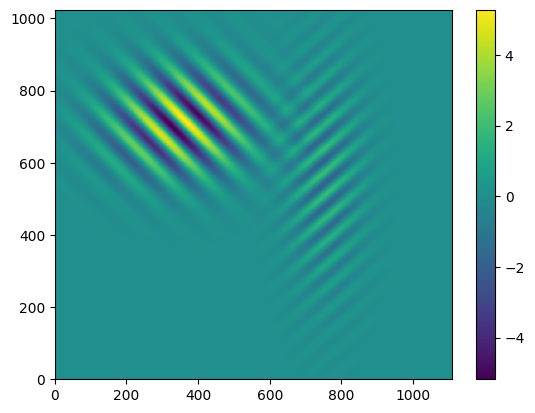

In [7]:
# Constants for this animation 
time_steps = 10            # Number of time steps 
time_resolution = 1800     # seconds, images are half an hour apart

# The resulting image arrays, for animation 
grid = np.zeros((height, width, time_steps))


# BUILD THE WARPED MODULATED IMAGES AT EACH TIME

for it in range(time_steps):
    t = it*time_resolution     # t is in seconds 

# dz measures vertical displacements: let's choose the sine function. Two packets 
    dz = zamplitude \
         * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) ) *Ampwindow 
    dz2 = zamplitude2 \
         * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) ) *Ampwindow2

# wave dx and dy are 90deg behind phase with dz, prop. to wavelength. 
# DIRECTION: For 45deg (wave going NE), k>0,l>0, dx>0,dy>0 (sketch it). 

    dxy = (zamplitude/PBLdepth)*wavelength \
          * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) -np.pi/2.) /DX
    dx = dxy * np.sin(direction *np.pi/180.) *Ampwindow # why /2? because it is too strong. Pixel units?? 
    dy = dxy * np.cos(direction *np.pi/180.) *Ampwindow

    dxy2= (zamplitude2/PBLdepth2)*wavelength2 \
          * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) -np.pi/2.) /DX
    dx2= dxy2* np.sin(direction2 *np.pi/180.) *Ampwindow2 
    dy2= dxy2* np.cos(direction2 *np.pi/180.) *Ampwindow2

# Warping by transporting pixels in original red image, wrapping (periodic) for now. SUBTRACT dy and dx in argument. 
    grid[:,:,it] = ndimage.map_coordinates(images[it],[Y-dy-dy2, X-dx-dx2])  

# Modulate (multiply) albedo by a wavy pattern (vertical displacements, 
#           make consistent with xmotion and ymotion arrays above) 
    grid[:,:,it] *= (1 + dz /PBLdepth  *5) 
    grid[:,:,it] *= (1 + dz2/PBLdepth2 *5) 

maxvalue = grid.max()
maxvalue

plt.pcolormesh(dy+dy2); plt.colorbar(); # pixels units -- surprising that 7 pixels make such a huge warp?

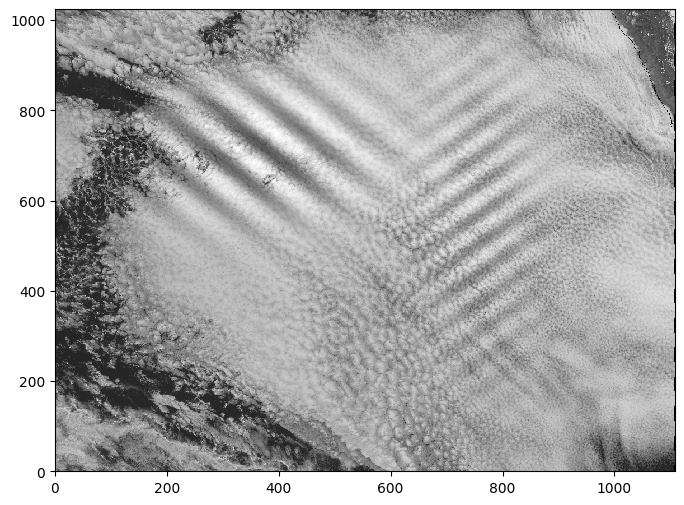

In [8]:
plt.figure(figsize=(8,6))
plt.pcolormesh(grid[:,:,0], cmap='Greys_r')

## Wavelet processing

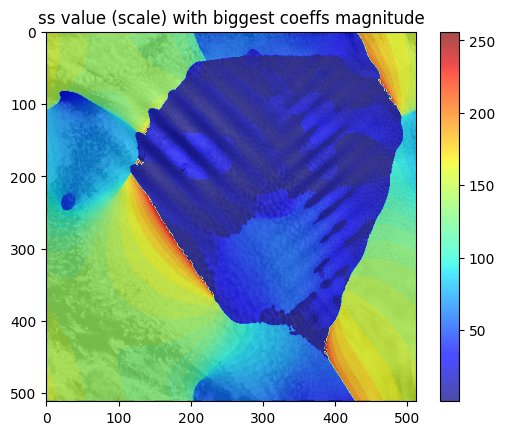

In [9]:
import numpy as np
import pywt
import py_cwt2d
from matplotlib import pyplot as plt

image = np.flipud(grid[::2,::2,0][:512,:512])  #*mask

# set up a range of scales in logarithmic spacing between 1 and 256 (image width / 2 seems to work here)
# small ss apparently means small scale
ss = np.geomspace(1.0,256.0,100)

# calculate the complex pycwt, and make the wavelet normalization factor CC
mother = 'mexh'
coeffs, wav_norm = py_cwt2d.cwt_2d(image, ss, mother)

# normalization factor for each contribution in reconstruction. Is it right? from web repo as found 
CC = 1.0 / (ss * wav_norm) 

# At each point, what scale has largest amplitude? 
# Tile to show the periodic assumption implicit in wavelet analysis

#plt.imshow( np.real(coeffs).max(axis=-1), alpha=0.5); plt.colorbar();   # the big amplitude
#plt.imshow( np.real(coeffs).argmax(axis=-1), alpha=0.5); plt.colorbar(); # the scale number it occurs at

plt.imshow(image, cmap='gray')
plt.imshow( ss[np.real(coeffs).argmax(axis=-1)], alpha=0.7,cmap='jet'); 

plt.colorbar(); # the ss it occurs at

plt.title('ss value (scale) with biggest coeffs magnitude'); 

In [10]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
from scipy.optimize import linear_sum_assignment
from scipy.spatial import distance
import py_cwt2d

# Step 1: Apply the Wavelet Transform to Each Frame in Batches
def apply_wavelet_transform(grid, scales, mother='mexh'):
    num_frames = grid.shape[2]
    coeffs_list = []
    wav_norm_list = []
    for i in range(num_frames):
        image = grid[:,:,i]
        coeffs, wav_norm = py_cwt2d.cwt_2d(image, scales, mother)
        coeffs_list.append(coeffs)
        wav_norm_list.append(wav_norm)

    return coeffs_list, wav_norm_list

# Step 2: Extract Dominant Scales for Each Pixel
def extract_dominant_scales(coeffs_list):
    dominant_scales_list = []

    for coeffs in coeffs_list:
        amplitude = np.real(coeffs)
        dominant_scale = np.argmax(amplitude, axis=-1)
        dominant_scales_list.append(dominant_scale)

    return dominant_scales_list

# Step 3: Cluster Pixels Based on Dominant Scales
def cluster_pixels(dominant_scales, n_clusters=3):
    clusters_list = []

    # Cluster the values equal to 3 or less
    dbscan = DBSCAN(eps=20, min_samples=1)
   

    for scales in dominant_scales:
        labels = dbscan.fit_predict(scales)
    return clusters_list

# Step 4: Track Clusters Across Frames
def track_clusters(clusters_list):
    tracked_clusters = []

    for i in range(len(clusters_list) - 1):
        cluster_centers1 = np.array([np.mean(np.column_stack(np.where(clusters_list[i] == j)), axis=0) for j in np.unique(clusters_list[i])])
        cluster_centers2 = np.array([np.mean(np.column_stack(np.where(clusters_list[i + 1] == j)), axis=0) for j in np.unique(clusters_list[i + 1])])

        cost_matrix = distance.cdist(cluster_centers1, cluster_centers2)
        row_ind, col_ind = linear_sum_assignment(cost_matrix)
        
        tracked_clusters.append((row_ind, col_ind))

    return tracked_clusters

# Main workflow
images = np.flipud(grid[::2,::2,][:512,:512])  
ss = np.geomspace(1.0,256.0,100)
scales = np.geomspace(1.0, np.max(images.shape)/2, 75)  # Reduced number of scales to save memory
coeffs_list, wav_norm_list = apply_wavelet_transform(images, scales)
dominant_scales_list = extract_dominant_scales(coeffs_list)
# clusters_list = cluster_pixels(dominant_scales_list)
# tracked_clusters = track_clusters(clusters_list)

# tracked_clusters now contains the tracked movement of clusters over time


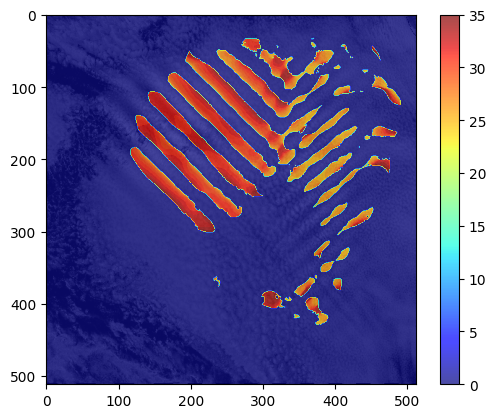

In [47]:
plt.imshow(image, cmap='gray')
plt.imshow(dominant_scales_list[0], alpha=0.7,cmap='jet'); 
plt.colorbar(); # the ss it occurs at

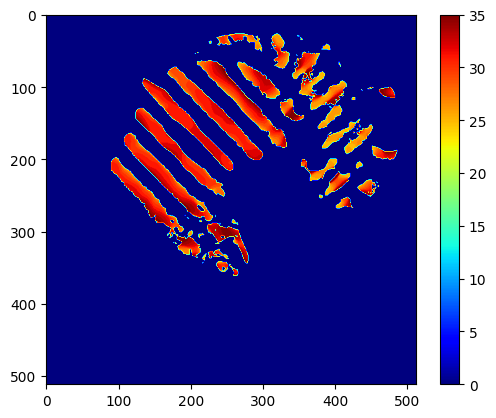

In [88]:
# only keep the scales between 25 and 35 and put the rest to zero
dominant_scales_list = np.array(dominant_scales_list)
dominant_scales_list[(dominant_scales_list < 25) | (dominant_scales_list > 35)] = 0

# plot the dominant scales
plt.imshow(dominant_scales_list[5], cmap='jet')
plt.colorbar()
plt.show()


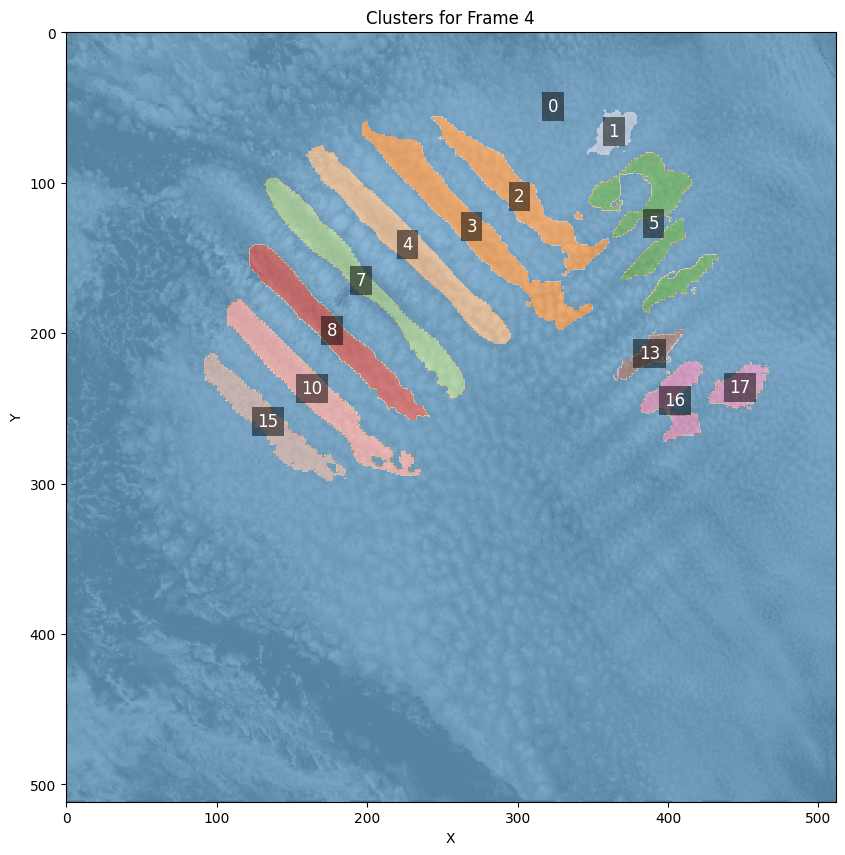

In [89]:
import numpy as np
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def cluster_nonzero_pixels(dominant_scales_list, eps=20, min_samples=1, size_threshold=150):
    clusters_list = []

    for dominant_scales in dominant_scales_list:
        # Extract coordinates of non-zero elements
        coords_array = np.nonzero(dominant_scales)
        coords_array = np.array(coords_array).T

        # Perform clustering on these coordinates
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(coords_array)

        # Remove clusters below the size threshold
        unique_labels, counts = np.unique(labels, return_counts=True)
        for label, count in zip(unique_labels, counts):
            if count < size_threshold:
                labels[labels == label] = -1  # Mark as noise

        # Create an array for clusters with the same shape as dominant_scales
        clusters = np.full(dominant_scales.shape, -1, dtype=int)
        clusters[coords_array[:, 0], coords_array[:, 1]] = labels

        clusters_list.append(clusters)

    return clusters_list

def visualize_clusters(grid, clusters, start_frame, end_frame):
    """Visualize the clusters for a range of frames."""
    for frame_index in range(start_frame, end_frame + 1):
        plt.figure(figsize=(10, 10))
        plt.imshow(grid[:, :, frame_index], cmap='gray', alpha=0.5, origin='upper')

        unique_labels = np.unique(clusters[frame_index])
        unique_labels = unique_labels[unique_labels != -1]  # Exclude the -1 label (unclustered points)
        num_labels = len(unique_labels)

        # Generate a colormap with the same number of unique labels
        colormap = ListedColormap(plt.cm.tab20.colors[:num_labels])
        plt.imshow(clusters[frame_index], cmap=colormap, alpha=0.5, origin='upper')

        # Label clusters at their center
        for label in unique_labels:
            mask = clusters[frame_index] == label
            coords = np.column_stack(np.where(mask))
            center = coords.mean(axis=0)
            plt.text(center[1], center[0], str(label), color='white', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

        plt.title(f'Clusters for Frame {frame_index}')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.show()

# Perform clustering on non-zero pixels
clusters_list = cluster_nonzero_pixels(dominant_scales_list, eps=10, min_samples=150,size_threshold=500)

# Visualize the clusters for the first 5 frames
visualize_clusters(images, clusters_list, start_frame=4, end_frame=4)
        

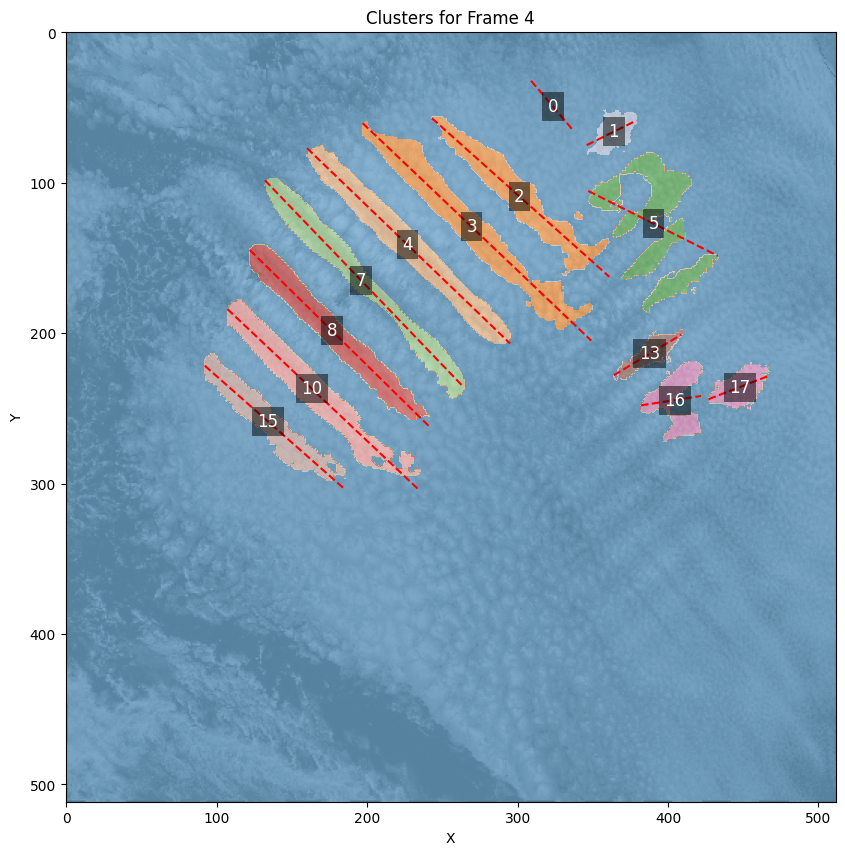

In [90]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def cluster_nonzero_pixels(dominant_scales_list, eps=20, min_samples=1, size_threshold=150):
    clusters_list = []

    for dominant_scales in dominant_scales_list:
        coords_array = np.nonzero(dominant_scales)
        coords_array = np.array(coords_array).T

        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(coords_array)

        unique_labels, counts = np.unique(labels, return_counts=True)
        for label, count in zip(unique_labels, counts):
            if count < size_threshold:
                labels[labels == label] = -1  # Marquer comme bruit

        clusters = np.full(dominant_scales.shape, -1, dtype=int)
        clusters[coords_array[:, 0], coords_array[:, 1]] = labels

        clusters_list.append(clusters)

    return clusters_list

def fit_linear_regression(coords):
    X = coords[:, 1].reshape(-1, 1)  # Utiliser les coordonnées X pour la régression
    y = coords[:, 0]  # Utiliser les coordonnées Y comme cible
    reg = LinearRegression().fit(X, y)
    return reg.coef_[0], reg.intercept_  # Retourner la pente et l'interception

def analyze_clusters(clusters_list):
    regression_params = []
    for clusters in clusters_list:
        unique_labels = np.unique(clusters)
        unique_labels = unique_labels[unique_labels != -1]

        frame_params = []
        for label in unique_labels:
            mask = clusters == label
            coords = np.column_stack(np.where(mask))
            slope, intercept = fit_linear_regression(coords)
            frame_params.append((label, slope, intercept))

        regression_params.append(frame_params)
    return regression_params

def visualize_clusters(grid, clusters, regression_params, start_frame, end_frame):
    for frame_index in range(start_frame, end_frame + 1):
        plt.figure(figsize=(10, 10))
        plt.imshow(grid[:, :, frame_index], cmap='gray', alpha=0.5, origin='upper')

        unique_labels = np.unique(clusters[frame_index])
        unique_labels = unique_labels[unique_labels != -1]
        num_labels = len(unique_labels)

        colormap = ListedColormap(plt.cm.tab20.colors[:num_labels])
        plt.imshow(clusters[frame_index], cmap=colormap, alpha=0.5, origin='upper')

        for label, slope, intercept in regression_params[frame_index]:
            mask = clusters[frame_index] == label
            coords = np.column_stack(np.where(mask))
            center = coords.mean(axis=0)
            plt.text(center[1], center[0], f'{label}', color='white', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
            x_vals = np.array([coords[:, 1].min(), coords[:, 1].max()])
            y_vals = intercept + slope * x_vals
            plt.plot(x_vals, y_vals, 'r--')

        plt.title(f'Clusters for Frame {frame_index}')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.show()


# Clustering des pixels non nuls
clusters_list = cluster_nonzero_pixels(dominant_scales_list, eps=10, min_samples=150,size_threshold=500)

# Analyse des clusters pour trouver les paramètres de régression linéaire
regression_params = analyze_clusters(clusters_list)

# Visualisation des clusters avec les régressions linéaires
visualize_clusters(images, clusters_list, regression_params, start_frame=4, end_frame=4)


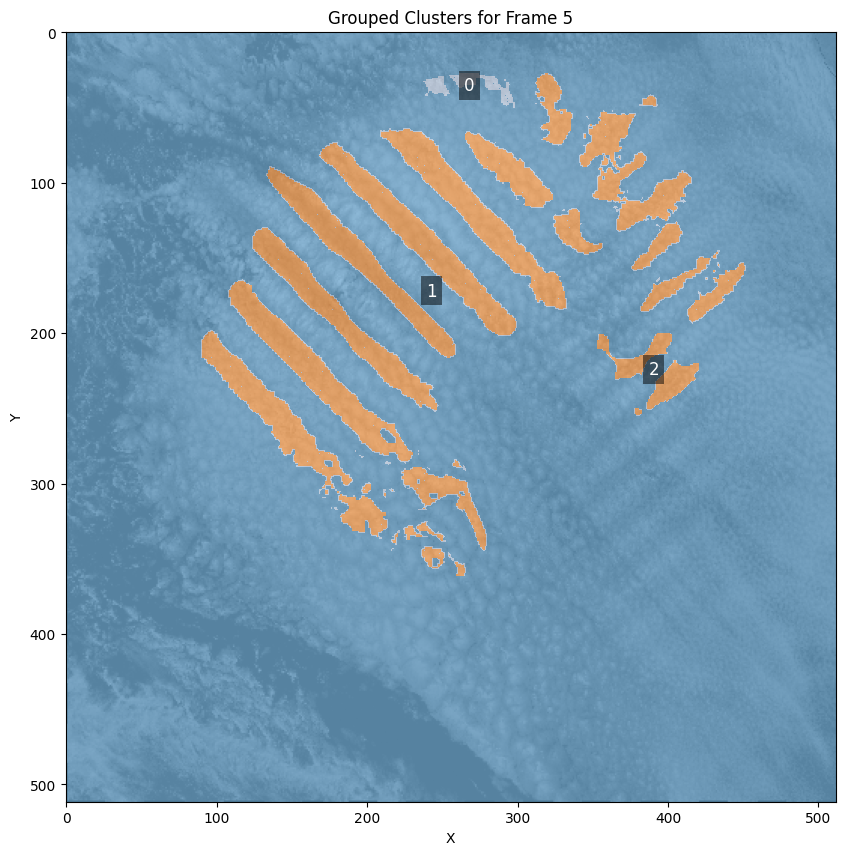

In [105]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.spatial.distance import euclidean

def cluster_nonzero_pixels(dominant_scales_list, eps=20, min_samples=1, size_threshold=150):
    clusters_list = []

    for dominant_scales in dominant_scales_list:
        coords_array = np.nonzero(dominant_scales)
        coords_array = np.array(coords_array).T

        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(coords_array)

        unique_labels, counts = np.unique(labels, return_counts=True)
        for label, count in zip(unique_labels, counts):
            if count < size_threshold:
                labels[labels == label] = -1

        clusters = np.full(dominant_scales.shape, -1, dtype=int)
        clusters[coords_array[:, 0], coords_array[:, 1]] = labels

        clusters_list.append(clusters)

    return clusters_list

def fit_linear_regression(coords):
    X = coords[:, 1].reshape(-1, 1)
    y = coords[:, 0]
    reg = LinearRegression().fit(X, y)
    return reg.coef_[0], reg.intercept_

def analyze_clusters(clusters_list):
    regression_params = []
    for clusters in clusters_list:
        unique_labels = np.unique(clusters)
        unique_labels = unique_labels[unique_labels != -1]

        frame_params = []
        for label in unique_labels:
            mask = clusters == label
            coords = np.column_stack(np.where(mask))
            slope, intercept = fit_linear_regression(coords)
            frame_params.append((label, slope, intercept, coords))

        regression_params.append(frame_params)
    return regression_params

def group_clusters_by_direction(clusters_params, distance_threshold=50, dot_product_threshold=0.95):
    def find_neighbors(frame_params, cluster_index, distance_threshold, dot_product_threshold):
        queue = [cluster_index]
        visited = set()
        group = []
        
        while queue:
            current_index = queue.pop(0)
            if current_index in visited:
                continue
            visited.add(current_index)
            group.append(current_index)
            
            label_i, slope_i, intercept_i, coords_i = frame_params[current_index]
            vector_i = np.array([1, slope_i])
            
            for neighbor_index, neighbor in enumerate(frame_params):
                if neighbor_index in visited or neighbor_index == current_index:
                    continue
                label_j, slope_j, intercept_j, coords_j = neighbor
                vector_j = np.array([1, slope_j])
                dot_product = np.dot(vector_i, vector_j) / (np.linalg.norm(vector_i) * np.linalg.norm(vector_j))
                
                center_i = coords_i.mean(axis=0)
                center_j = coords_j.mean(axis=0)
                distance = euclidean(center_i, center_j)
                
                if dot_product >= dot_product_threshold and distance <= distance_threshold:
                    queue.append(neighbor_index)
        
        return group

    grouped_clusters = []
    for frame_params in clusters_params:
        visited = set()
        frame_grouped_clusters = []

        for cluster_index, cluster in enumerate(frame_params):
            if cluster_index in visited:
                continue
            group_indices = find_neighbors(frame_params, cluster_index, distance_threshold, dot_product_threshold)
            for index in group_indices:
                visited.add(index)
            frame_grouped_clusters.append([frame_params[i] for i in group_indices])
        
        grouped_clusters.append(frame_grouped_clusters)
    return grouped_clusters

def visualize_grouped_clusters(grid, clusters_list, grouped_clusters, start_frame, end_frame):
    for frame_index in range(start_frame, end_frame + 1):
        plt.figure(figsize=(10, 10))
        plt.imshow(grid[:, :, frame_index], cmap='gray', alpha=0.5, origin='upper')

        cluster_map = np.full(clusters_list[frame_index].shape, -1, dtype=int)
        for group_id, group in enumerate(grouped_clusters[frame_index]):
            for label, slope, intercept, coords in group:
                cluster_map[clusters_list[frame_index] == label] = group_id
        
        unique_labels = np.unique(cluster_map)
        unique_labels = unique_labels[unique_labels != -1]
        num_labels = len(unique_labels)

        colormap = ListedColormap(plt.cm.tab20.colors[:num_labels])
        plt.imshow(cluster_map, cmap=colormap, alpha=0.5, origin='upper')

        for group_id in unique_labels:
            mask = cluster_map == group_id
            coords = np.column_stack(np.where(mask))
            center = coords.mean(axis=0)
            plt.text(center[1], center[0], f'{group_id}', color='white', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

        plt.title(f'Grouped Clusters for Frame {frame_index}')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.show()


# Clustering des pixels non nuls
clusters_list = cluster_nonzero_pixels(dominant_scales_list, eps=10, min_samples=50, size_threshold=500)

# Analyse des clusters pour trouver les paramètres de régression linéaire
regression_params = analyze_clusters(clusters_list)

# Regroupement des clusters par direction avec distance de voisinage
grouped_clusters = group_clusters_by_direction(regression_params, distance_threshold=150, dot_product_threshold=0.95)

# Visualisation des clusters regroupés
visualize_grouped_clusters(images, clusters_list, grouped_clusters, start_frame=5, end_frame=5)


C:\Users\ratynski\AppData\Local\Temp\ipykernel_3512\3490611579.py:116: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = ListedColormap(plt.cm.get_cmap('tab20', num_labels).colors)


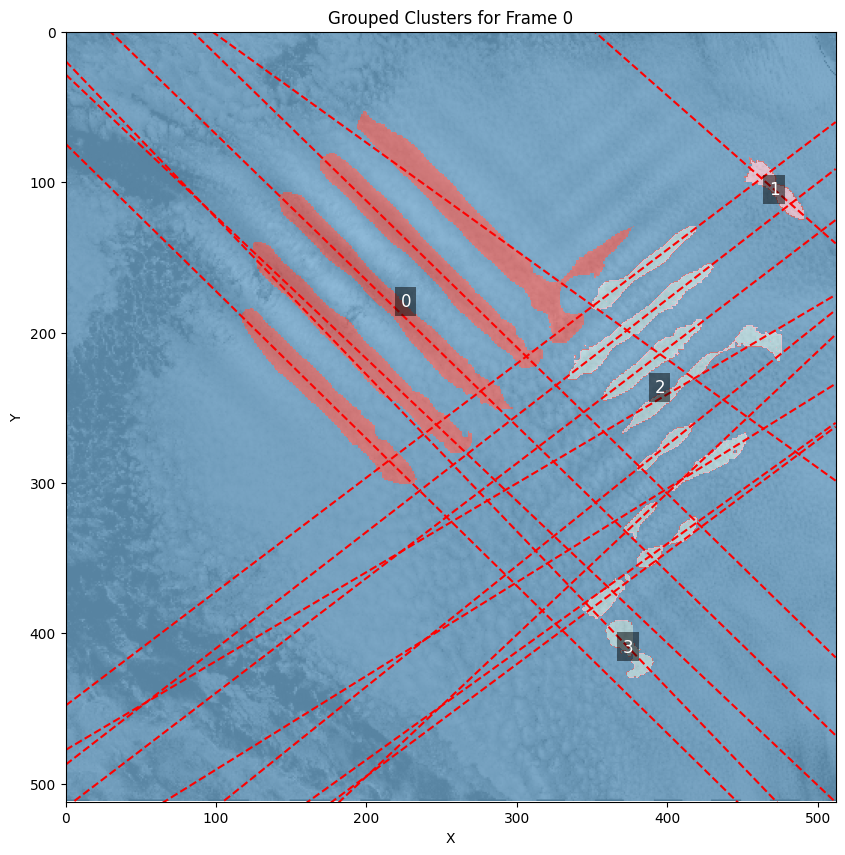

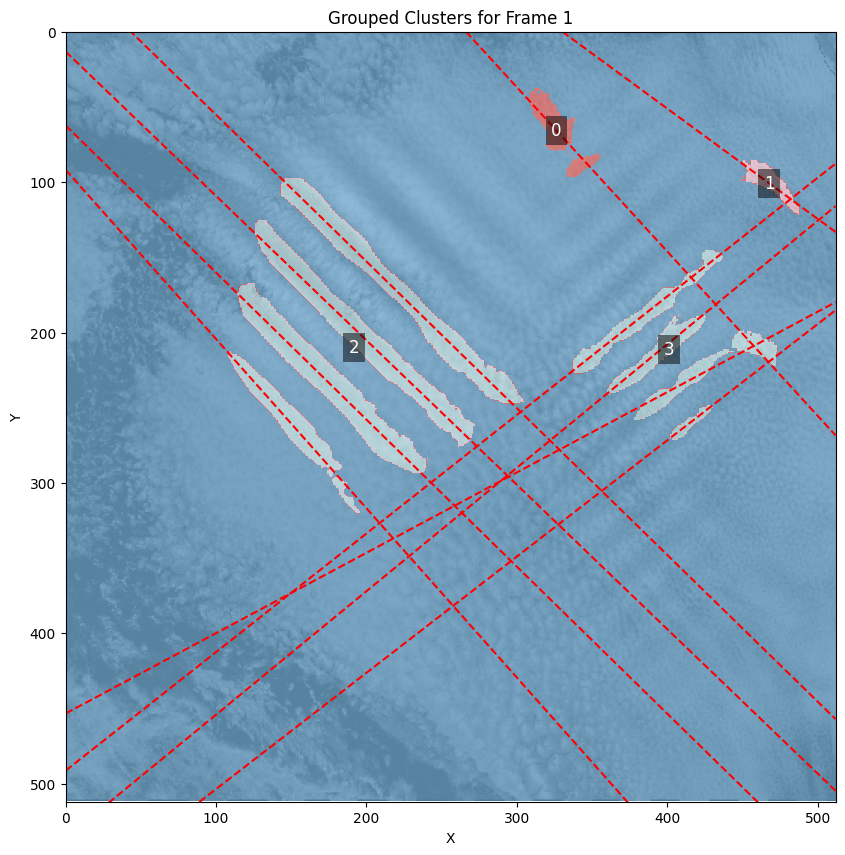

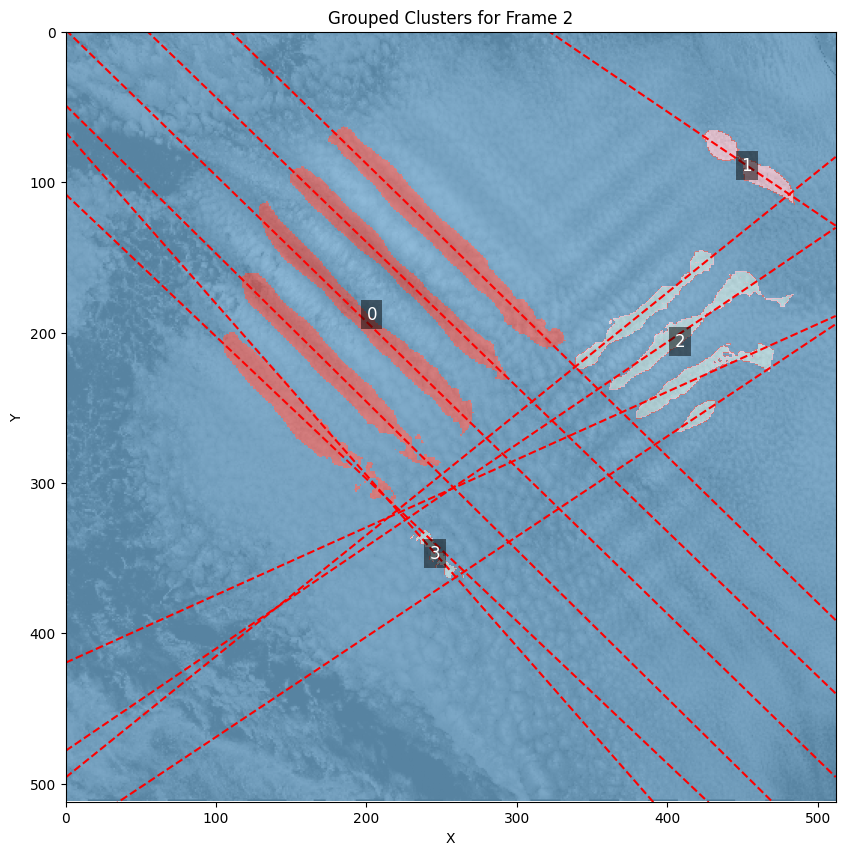

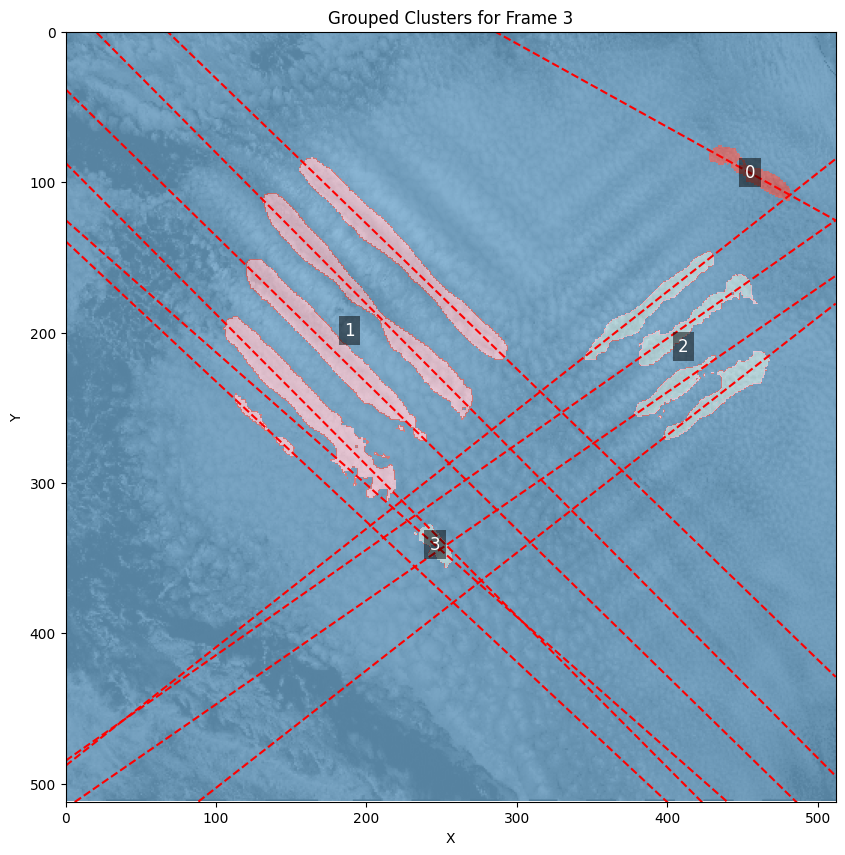

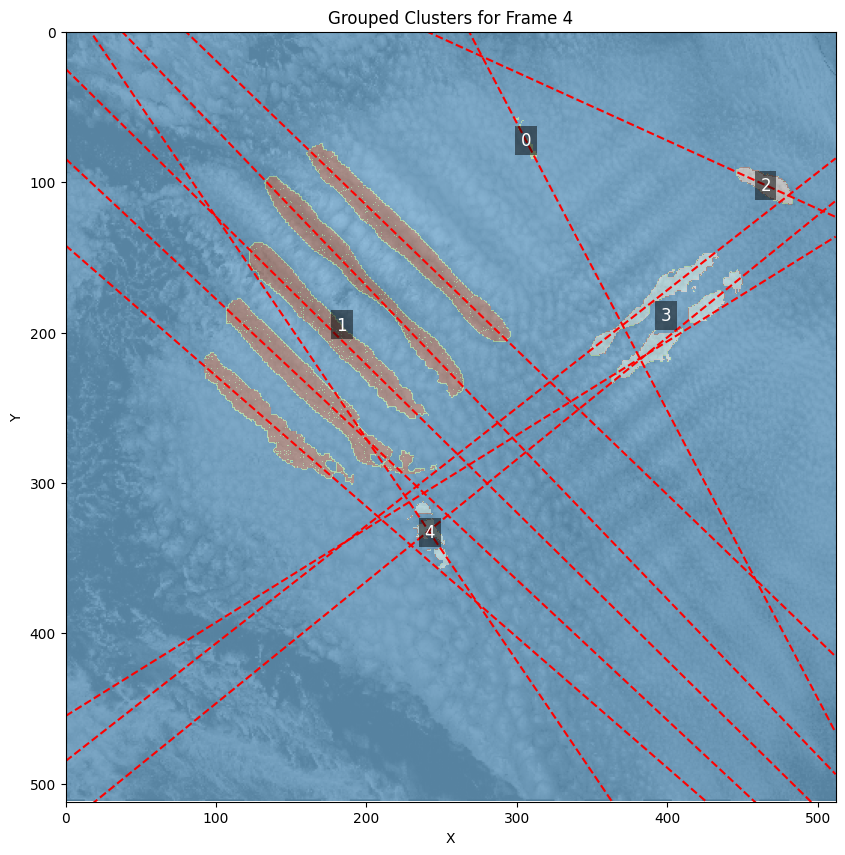

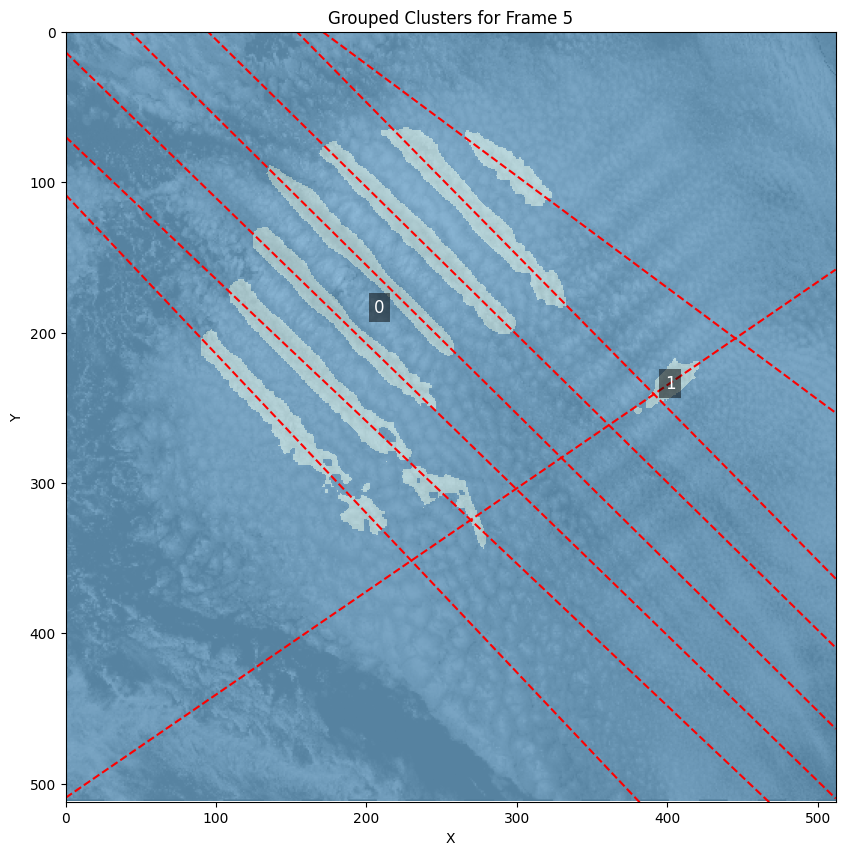

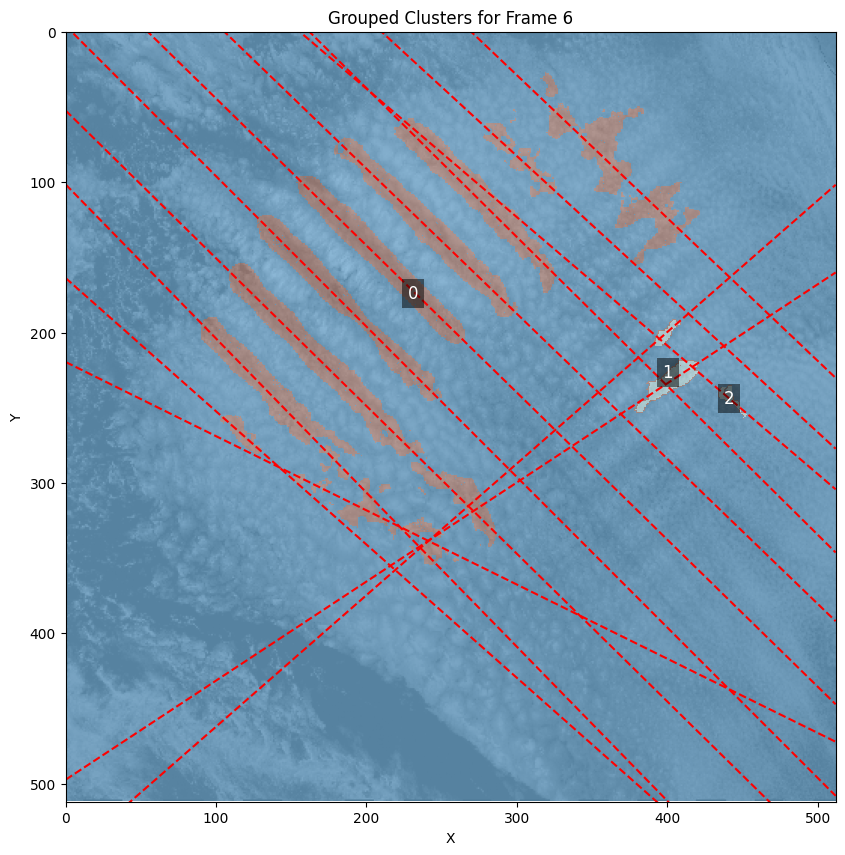

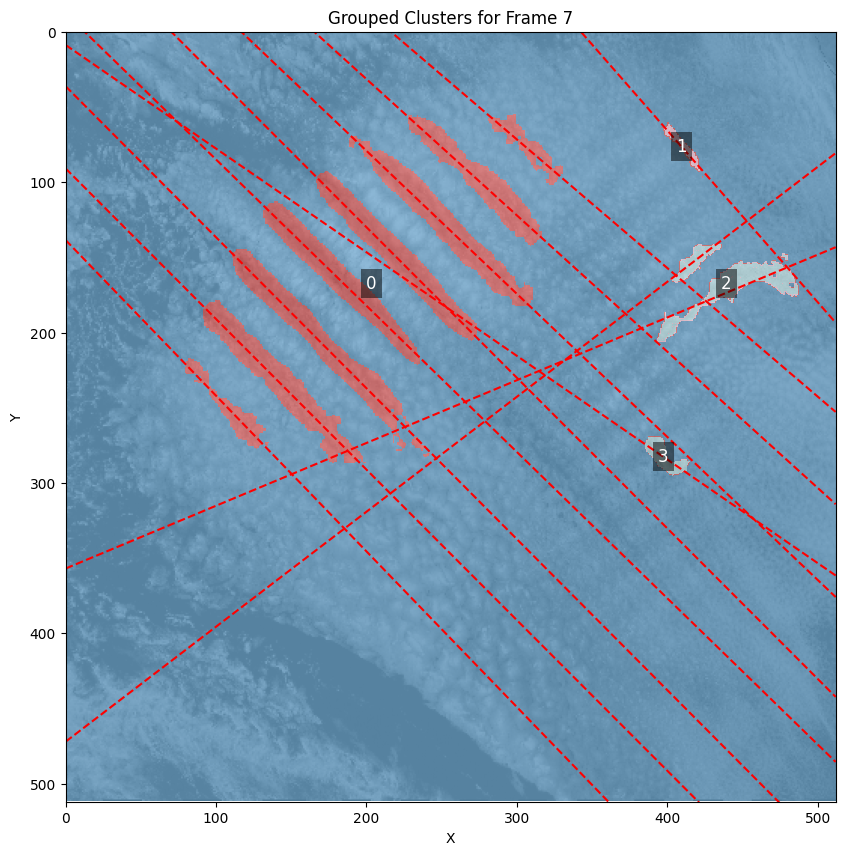

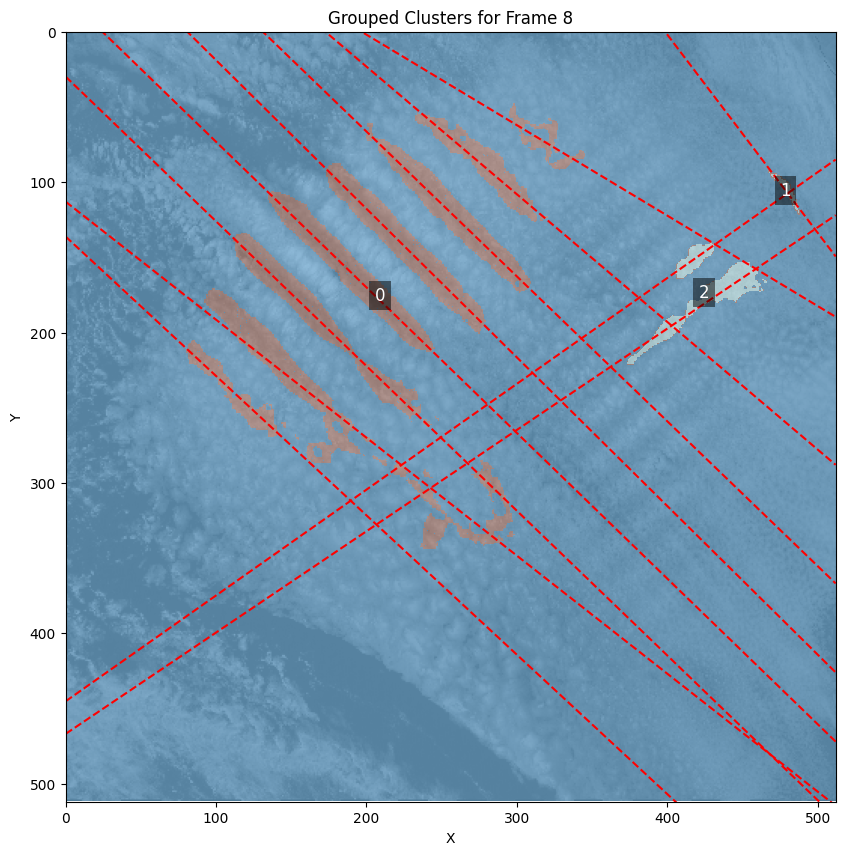

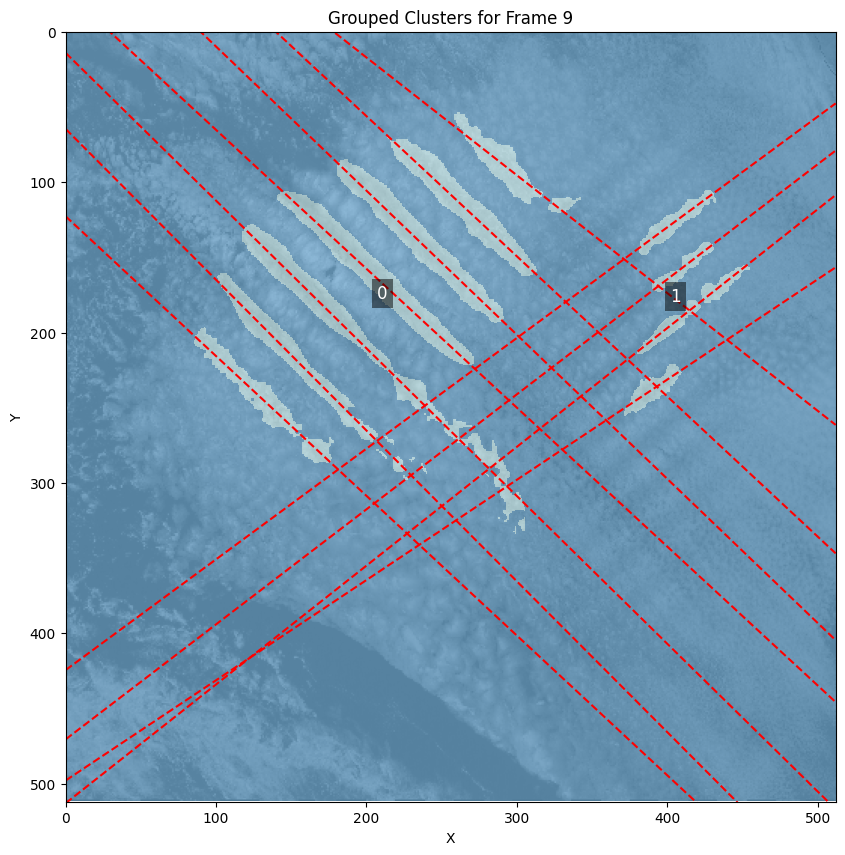

In [112]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.spatial.distance import euclidean

def cluster_nonzero_pixels(dominant_scales_list, eps=5, min_samples=5, size_threshold=100):
    clusters_list = []

    for dominant_scales in dominant_scales_list:
        coords_array = np.nonzero(dominant_scales)
        coords_array = np.array(coords_array).T

        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(coords_array)

        unique_labels, counts = np.unique(labels, return_counts=True)
        for label, count in zip(unique_labels, counts):
            if count < size_threshold:
                labels[labels == label] = -1

        clusters = np.full(dominant_scales.shape, -1, dtype=int)
        clusters[coords_array[:, 0], coords_array[:, 1]] = labels

        clusters_list.append(clusters)

    return clusters_list

def fit_linear_regression(coords):
    X = coords[:, 1].reshape(-1, 1)
    y = coords[:, 0]
    reg = LinearRegression().fit(X, y)
    r2 = reg.score(X, y)
    return reg.coef_[0], reg.intercept_, r2

def analyze_clusters(clusters_list):
    regression_params = []
    for clusters in clusters_list:
        unique_labels = np.unique(clusters)
        unique_labels = unique_labels[unique_labels != -1]

        frame_params = []
        for label in unique_labels:
            mask = clusters == label
            coords = np.column_stack(np.where(mask))
            slope, intercept, r2 = fit_linear_regression(coords)
            if r2 > 0.5:  # Adjust R^2 threshold as needed
                frame_params.append((label, slope, intercept, coords, r2))

        regression_params.append(frame_params)
    return regression_params

def group_clusters_by_direction(clusters_params, distance_threshold=50, dot_product_threshold=0.95):
    def find_neighbors(frame_params, cluster_index, distance_threshold, dot_product_threshold):
        queue = [cluster_index]
        visited = set()
        group = []
        
        while queue:
            current_index = queue.pop(0)
            if current_index in visited:
                continue
            visited.add(current_index)
            group.append(current_index)
            
            label_i, slope_i, intercept_i, coords_i, _ = frame_params[current_index]
            vector_i = np.array([1, slope_i])
            
            for neighbor_index, neighbor in enumerate(frame_params):
                if neighbor_index in visited or neighbor_index == current_index:
                    continue
                label_j, slope_j, intercept_j, coords_j, _ = neighbor
                vector_j = np.array([1, slope_j])
                dot_product = np.dot(vector_i, vector_j) / (np.linalg.norm(vector_i) * np.linalg.norm(vector_j))
                
                center_i = coords_i.mean(axis=0)
                center_j = coords_j.mean(axis=0)
                distance = euclidean(center_i, center_j)
                
                if dot_product >= dot_product_threshold and distance <= distance_threshold:
                    queue.append(neighbor_index)
        
        return group

    grouped_clusters = []
    for frame_params in clusters_params:
        visited = set()
        frame_grouped_clusters = []

        for cluster_index, cluster in enumerate(frame_params):
            if cluster_index in visited:
                continue
            group_indices = find_neighbors(frame_params, cluster_index, distance_threshold, dot_product_threshold)
            for index in group_indices:
                visited.add(index)
            frame_grouped_clusters.append([frame_params[i] for i in group_indices])
        
        grouped_clusters.append(frame_grouped_clusters)
    return grouped_clusters

def visualize_grouped_clusters(grid, clusters_list, grouped_clusters, start_frame, end_frame, show_regressions=False):
    for frame_index in range(start_frame, end_frame + 1):
        plt.figure(figsize=(10, 10))
        plt.imshow(grid[:, :, frame_index], cmap='gray', alpha=0.5, origin='upper')

        cluster_map = np.full(clusters_list[frame_index].shape, -1, dtype=int)
        for group_id, group in enumerate(grouped_clusters[frame_index]):
            for label, slope, intercept, coords, _ in group:
                cluster_map[clusters_list[frame_index] == label] = group_id
        
        unique_labels = np.unique(cluster_map)
        unique_labels = unique_labels[unique_labels != -1]
        num_labels = len(unique_labels)

        colormap = ListedColormap(plt.cm.get_cmap('tab20', num_labels).colors)
        plt.imshow(cluster_map, cmap=colormap, alpha=0.5, origin='upper')

        plt.xlim(0, grid.shape[1])
        plt.ylim(grid.shape[0], 0)

        for group_id in unique_labels:
            mask = cluster_map == group_id
            coords = np.column_stack(np.where(mask))
            center = coords.mean(axis=0)
            plt.text(center[1], center[0], f'{group_id}', color='white', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
            if show_regressions:
                for _, slope, intercept, _, _ in grouped_clusters[frame_index][group_id]:
                    x_vals = np.array([0, grid.shape[1]])
                    y_vals = intercept + slope * x_vals
                    plt.plot(x_vals, y_vals, 'r--')

        plt.title(f'Grouped Clusters for Frame {frame_index}')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.show()


# Clustering des pixels non nuls
clusters_list = cluster_nonzero_pixels(dominant_scales_list, eps=5, min_samples=5, size_threshold=100)

# Analyse des clusters pour trouver les paramètres de régression linéaire
regression_params = analyze_clusters(clusters_list)

# Regroupement des clusters par direction avec distance de voisinage
grouped_clusters = group_clusters_by_direction(regression_params, distance_threshold=100, dot_product_threshold=0.90)

# Visualisation des clusters regroupés avec régressions linéaires
visualize_grouped_clusters(images, clusters_list, grouped_clusters, start_frame=0, end_frame=9, show_regressions=True)
